# Livraison

## Importation

In [3]:
# LES ALGORITHMES
from QLearning import *
from DQN import *
from PPO import *
import time

# Pour RLLib
import ray
from ray.rllib.algorithms.dqn import DQNConfig
from ray.rllib.connectors.env_to_module import FlattenObservations
from ray import train, tune
from rllib_helper import *

# POUR AFFICHAGE
import matplotlib.pyplot as plt
import seaborn as sns
from helperPlot import *

# POUR ENVIRONNEMENT
import gymnasium
from gymnasium import spaces
from stable_baselines3.common.env_checker import check_env

## Environnements

Environnement 1 : position et boîte en un unique entier : One Hot Encoding

In [3]:
class LivraisonEnv(gymnasium.Env) :
    def __init__(self, carte) :
        super(LivraisonEnv, self).__init__()
        self.size = len(carte)
        self.action_space = spaces.Discrete(4)
        self.observation_space = spaces.Discrete(2 * (self.size ** 2))
        self.map = carte
        self.state = 0
        self.hasBox = False

    def reset(self, seed = None, options = None) :
        super().reset(seed = seed)
        self.state = 0
        self.hasBox = False
        return self.state, {}

    def step(self, action) :
        x, y = self._stateToCoordinate(self.state)
        if action == 0 : # Left
            if x > 0 :
                x -= 1
        elif action == 1 : # Down
            if y < self.size -1 :
                y += 1
        elif action == 2 : # Right
            if x < self.size -1 :
                x += 1
        elif action == 3 : # Up
            if y > 0 :
                y -= 1
        
        
        result = self.map[y][x]
        
        if result == 'B' :
            self.hasBox = True

        self.state = self._coordinateToState(x, y)

        
        if result == 'G' and self.hasBox :
            reward = 1
            done = True
        elif result == 'H' :
            reward = -1
            done = True
        else :
            reward = -1/(self.size**2)
            done = False
        return self.state, reward, done, False, {}

    
    def _stateToCoordinate(self, state) :
        if state >= self.size ** 2 :
            state -= self.size ** 2
        x = state % self.size
        y = state // self.size
        return x, y

    
    def _coordinateToState(self, x, y) :
        toReturn = self.size*y + x
        if self.hasBox :
            toReturn += self.size ** 2
        return toReturn

    def render(self) :
        x, y = self._stateToCoordinate(self.state)
        toPrint = ''
        for i in range(self.size) :
            toPrintRow = ''
            row = self.map[i]
            for j in range(self.size) :
                if (j, i) == (x, y):
                    toPrintRow += '.'
                else :
                    toPrintRow += row[j]
            toPrint += toPrintRow + '\n'
        print(toPrint)
        if self.state == (self.size**2) - 1 :
            print("Objectif atteint")

Environnement 2 : position et boîte codée différemment : one hot encoding pour les deux

In [12]:
class Livraison2Env(gymnasium.Env) :
    def __init__(self, carte) :
        super(Livraison2Env, self).__init__()
        self.size = len(carte)
        self.action_space = spaces.Discrete(4)
        self.observation_space = spaces.MultiDiscrete([self.size ** 2, 2])
        self.map = carte
        self.state = 0
        self.hasBox = False

    def reset(self, seed = None, options = None) :
        super().reset(seed = seed)
        self.state = 0
        self.hasBox = False
        return [self.state, 0], {}

    def step(self, action) :
        x, y = self._stateToCoordinate(self.state)
        if action == 0 : # Left
            if x > 0 :
                x -= 1
        elif action == 1 : # Down
            if y < self.size -1 :
                y += 1
        elif action == 2 : # Right
            if x < self.size -1 :
                x += 1
        elif action == 3 : # Up
            if y > 0 :
                y -= 1
        
        
        result = self.map[y][x]
        
        if result == 'B' :
            self.hasBox = True

        self.state = self._coordinateToState(x, y)

        
        if result == 'G' and self.hasBox :
            reward = 1
            done = True
        elif result == 'H' :
            reward = -1
            done = True
        else :
            reward = -1/(self.size**2)
            done = False

        if self.hasBox :
            return [self.state, 1], reward, done, False, {}
        else :
            return [self.state, 0], reward, done, False, {}

    
    def _stateToCoordinate(self, state) :
        x = state % self.size
        y = state // self.size
        return x, y

    
    def _coordinateToState(self, x, y) :
        toReturn = self.size*y + x
        return toReturn

    def render(self) :
        x, y = self._stateToCoordinate(self.state)
        toPrint = ''
        for i in range(self.size) :
            toPrintRow = ''
            row = self.map[i]
            for j in range(self.size) :
                if (j, i) == (x, y):
                    toPrintRow += '.'
                else :
                    toPrintRow += row[j]
            toPrint += toPrintRow + '\n'
        print(toPrint)
        if self.state == (self.size**2) - 1 :
            print("Objectif atteint")

Livraison 3

In [5]:
class Livraison3Env(gymnasium.Env) :
    def __init__(self, options = None) :
        super(Livraison3Env, self).__init__()
        self.cell_values = {'F' : 0, 'S' : 0, 'H' : 1, 'G' : 2, 'B' : 3, 'W' : 4}

        self.map = options['carte']
        
        self.size = len(self.map)
        self.width = len(self.map[0])
        self.height = len(self.map)
        
        self.action_space = spaces.Discrete(4)
        self.observation_space = spaces.Dict({
            'row_position' : spaces.Box(low = 0, high = self.width - 1, dtype = int),
            'col_position' : spaces.Box(low = 0, high = self.height - 1, dtype = int),
            'possession' : spaces.Box(low = 0, high = 1, dtype = int),
            'left_neighbor' : spaces.Discrete(5),
            'down_neighbor' : spaces.Discrete(5),
            'right_neighbor' : spaces.Discrete(5),
            'up_neighbor' :spaces.Discrete(5)
        })
        self.state = 0
        self.x = 0
        self.y = 0
        self.hasBox = False

    def reset(self, seed = None, options = None) :
        super().reset(seed = seed)
        self.state = 0
        self.hasBox = False
        left, down, right, up = self._getNeighbors(self.state)
        toReturn = {
            "row_position" : np.array([0]),
            "col_position" : np.array([0]),
            "possession" : np.array([1 if self.hasBox else 0]),
            'left_neighbor' : left,
            'down_neighbor' : down,
            'right_neighbor' : right,
            'up_neighbor' : up
        }
        return toReturn, {}

    def step(self, action) :
        x, y = self._stateToCoordinate(self.state)
        if action == 0 : # Left
            if x > 0 :
                x -= 1
        elif action == 1 : # Down
            if y < self.size -1 :
                y += 1
        elif action == 2 : # Right
            if x < self.size -1 :
                x += 1
        elif action == 3 : # Up
            if y > 0 :
                y -= 1
        
        
        result = self.map[y][x]
        
        if result == 'B' :
            self.hasBox = True

        self.state = self._coordinateToState(x, y)

        
        if result == 'G' and self.hasBox :
            reward = 1
            done = True
        elif result == 'H' :
            reward = -1
            done = True
        else :
            reward = -1/(self.size**2)
            done = False

        left, down, right, up = self._getNeighbors(self.state)

        toReturn = {
            "row_position" : [x],
            "col_position" : [y],
            "possession" : [1 if self.hasBox else 0],
            'left_neighbor' : left,
            'down_neighbor' : down,
            'right_neighbor' : right,
            'up_neighbor' : up
        }

        return toReturn, reward, done, False, {}


    
    def _stateToCoordinate(self, state) :
        x = state % self.size
        y = state // self.size
        return x, y

    
    def _coordinateToState(self, x, y) :
        toReturn = self.size*y + x
        return toReturn


    def _getNeighbors(self, state) :
        x, y = self._stateToCoordinate(state)
        if x == 0 :  # Retrieve left cell
            left = self.cell_values['W']
        else :
            left = self.cell_values[self.map[y][x-1]]

        if y == self.height -1 :  # Retrieve down cell
            down = self.cell_values["W"]
        else :
            down = self.cell_values[self.map[y+1][x]]

        if x == self.width -1 :   # Retrieve right cell
            right = self.cell_values["W"]
        else :
            right = self.cell_values[self.map[y][x+1]]

        if y == 0 :   # Retrieve up cell
            up = self.cell_values["W"]
        else :
            up = self.cell_values[self.map[y-1][x]]

        return left, down, right, up
    

    
    def render(self) :
        x, y = self._stateToCoordinate(self.state)
        toPrint = ''
        for i in range(self.size) :
            toPrintRow = ''
            row = self.map[i]
            for j in range(self.size) :
                if (j, i) == (x, y):
                    toPrintRow += '.'
                else :
                    toPrintRow += row[j]
            toPrint += toPrintRow + '\n'
        print(toPrint)
        if self.state == (self.size**2) - 1 :
            print("Objectif atteint")

Fonctions d'aide pour l'environnement

In [6]:
def is_valid(board, max_size) :
    return is_box_reachable(board, max_size) and is_goal_reachable(board, max_size)

def is_box_reachable(board, max_size) :
    frontier, discovered = [], set()
    frontier.append((0, 0))
    while frontier:
        r, c = frontier.pop()
        if not (r, c) in discovered:
            discovered.add((r, c))
            directions = [(1, 0), (0, 1), (-1, 0), (0, -1)]
            for x, y in directions:
                r_new = r + x
                c_new = c + y
                if r_new < 0 or r_new >= max_size or c_new < 0 or c_new >= max_size:
                    continue
                if board[r_new][c_new] == "B":
                    return True
                if board[r_new][c_new] != "H":
                    frontier.append((r_new, c_new))
    return False
    
def is_goal_reachable(board, max_size):
    frontier, discovered = [], set()
    frontier.append((0, 0))
    while frontier:
        r, c = frontier.pop()
        if not (r, c) in discovered:
            discovered.add((r, c))
            directions = [(1, 0), (0, 1), (-1, 0), (0, -1)]
            for x, y in directions:
                r_new = r + x
                c_new = c + y
                if r_new < 0 or r_new >= max_size or c_new < 0 or c_new >= max_size:
                    continue
                if board[r_new][c_new] == "G":
                    return True
                if board[r_new][c_new] != "H":
                    frontier.append((r_new, c_new))
    return False


def generate_random_map(size = 8, p = 0.8) :
    valid = False
    board = []

    while not valid:
        p = min(1, p)
        board = np.random.choice(["F", "H"], (size, size), p=[p, 1 - p])
        x = np.random.randint(0, size)
        y = np.random.randint(0, size)
        while (x, y) == (0, 0) or (x, y) == (size-1, size-1) :
            x = np.random.randint(0, size)
            y = np.random.randint(0, size)
        board[x][y] = "B"
        board[0][0] = "S"
        board[-1][-1] = "G"
        valid = is_valid(board, size)
    return ["".join(x) for x in board]

## Entraînement DQN

.FFF
FFFH
FHBH
FFFG



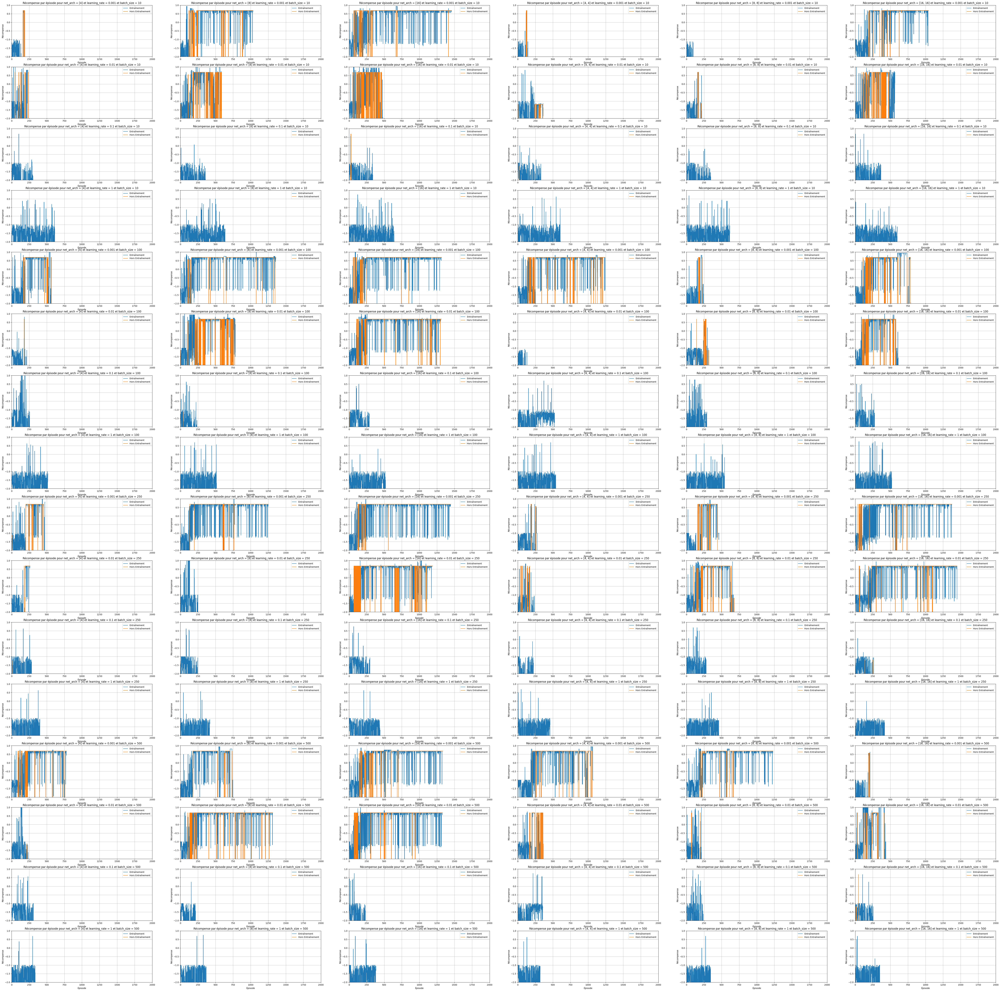

In [8]:
net_arch = [[4], [8], [16], [4, 4], [8, 8], [16, 16]]
lr = [0.001, 0.01, 0.1, 1]
batch_size = [10, 100, 250, 500]


timesteps = 10000
savePath = "Livraison_DQN_4.png"

size = 4

env = Livraison3Env({'carte' : generate_random_map(size)})
env.render()

plot_dqn_performance_forAll3(savePath, env, timesteps, (2000, -2, 1), 
                                    [],
                                    "net_arch", net_arch,
                                    "learning_rate", lr, 
                                    "batch_size", batch_size
                            )

.BFF
FHFF
FHFF
FFFG



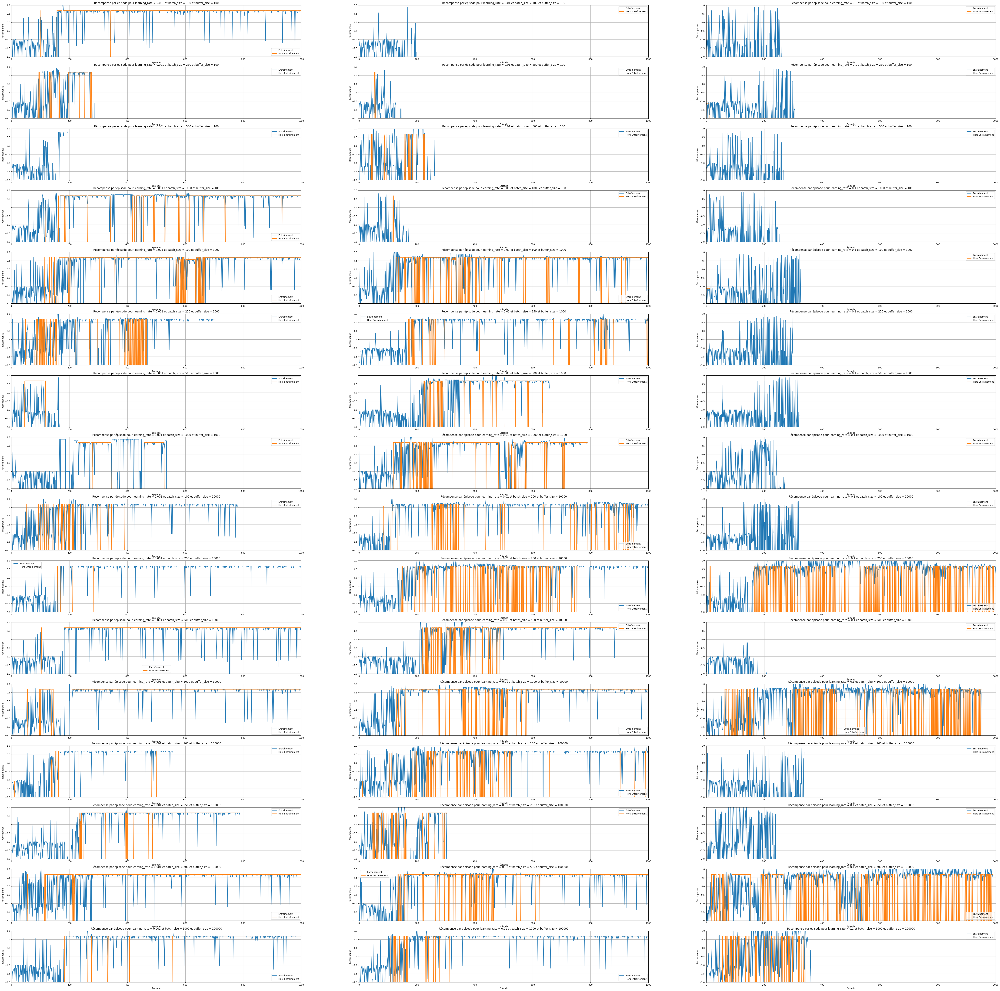

In [10]:
predefined = [('net_arch', [16])]

lr = [0.001, 0.01, 0.1]
batch_size = [100, 250, 500, 1000]
buffer_size = [100, 1000, 10000, 100000]

timesteps = 10000
savePath = "Livraison_DQN_4.png"

size = 4

env = Livraison3Env({"carte" : generate_random_map(size)})
env.render()

plot_dqn_performance_forAll3(savePath, env, timesteps, (1000, -2, 1), 
                             predefined,
                             "learning_rate", lr,
                             "batch_size", batch_size,
                             "buffer_size", buffer_size
                            )

Les meilleurs résultats sont obtenus pour
- learning_rate = 0.001
- batch_size = 1000
- buffer_size = 10000

## Comparaison Nouveau DQN vs Ancien DQN

.HFF
FHFF
FFFB
FFFG

Entraînement pour labyrinthe de taille 4 sur 40000 timesteps terminé.
Ancien DQN prend 84.5284595489502 secondes pour son entraînement
Nouveau DQN prend 112.98449540138245 secondes pour son entraînement



.HHFFF
FFBFFF
FFFFFF
HHFHFF
FFFFFF
FFHFFG

Entraînement pour labyrinthe de taille 6 sur 40000 timesteps terminé.
Ancien DQN prend 91.16725945472717 secondes pour son entraînement
Nouveau DQN prend 134.52201676368713 secondes pour son entraînement



.FFFFFFF
HHFFFHHF
HFFHFFHF
FFHFFFFF
HFBHFHFF
FFFFFFFF
FFFHFFHF
FFFHHFFG

Entraînement pour labyrinthe de taille 8 sur 40000 timesteps terminé.
Ancien DQN prend 125.08491826057434 secondes pour son entraînement
Nouveau DQN prend 134.53632187843323 secondes pour son entraînement



.FFHFFHFFF
FFFFHFFHFF
FFFFHFHFFF
FFHFFFFFHF
FBFFFHFHHF
FFFHFFFFFF
HFHFHHFFHF
HFHFFHHFFF
FHFFFFFFFF
HFFFHHFHFG

Entraînement pour labyrinthe de taille 10 sur 40000 timesteps terminé.
Ancien DQN prend 113.60426640510559 secondes pour son entraî

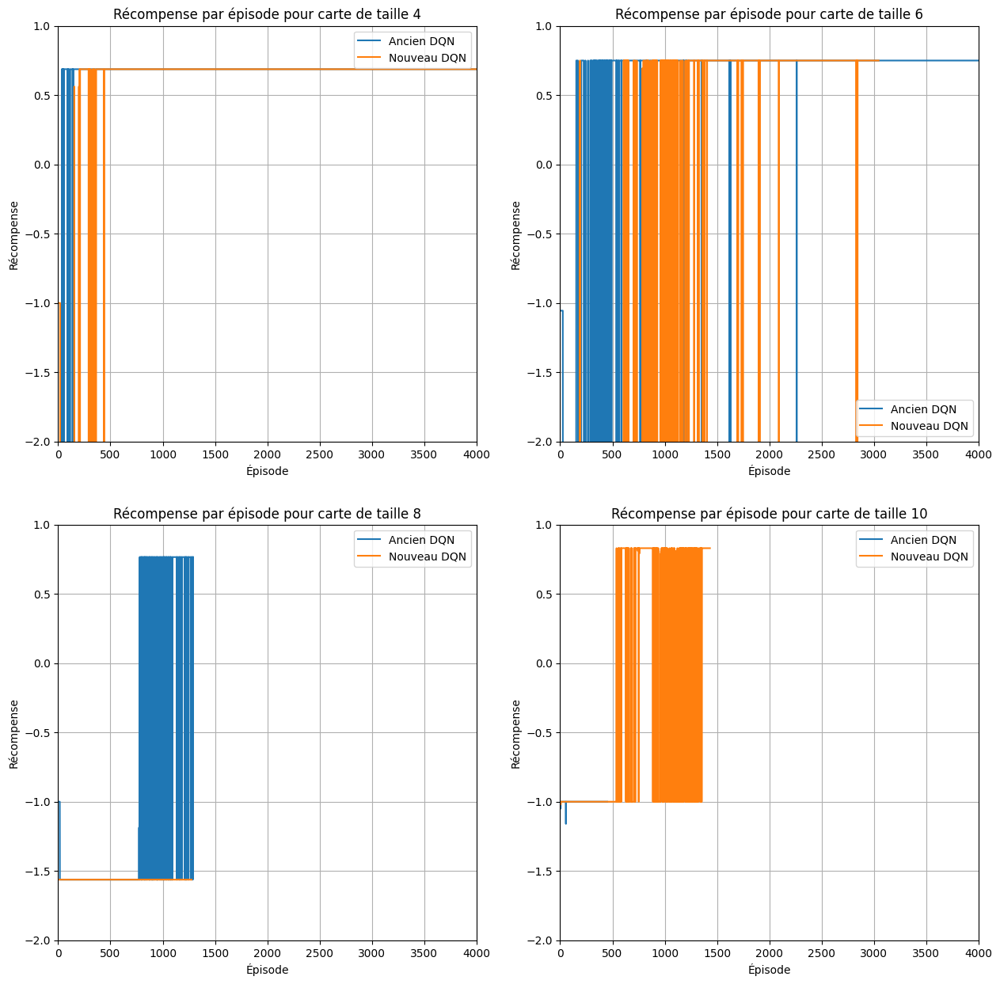

In [14]:
data = [(4, 40000, 4000, 0, 0, (1, 0.05, 0.2, 0.001, 0.99, [32], 50, 10000, 500, [16])),
        (6, 40000, 4000, 0, 1, (1, 0.05, 0.2, 0.0001, 0.99, [64], 50, 10000, 50, [16])),
        (8, 40000, 4000, 1, 0, (1, 0.05, 0.2, 0.0001, 0.99, [64], 50, 10000, 50, [64, 64])),
        (10, 40000, 4000, 1, 1, (1, 0.05, 0.2, 0.0001, 0.99, [64], 50, 10000, 50, [64, 64]))]
fig, axes = plt.subplots(2, 2, figsize=(15, 15))




"""
TAILLE 4 et 6 nouveau codage :
exploration_initial_eps = 1
exploration_final_eps = 0
exploration_fraction = 0.2

buffer_size = 100000
batch_size = 1000
update_freq = 50
net_arch = [16]

learning_rate = 0.001
gamma = 0.99
"""


for (size, timesteps, maxX, x, y,
     (eps_start, eps_end, eps_frac, lr, gamma, net_arch, update_freq, buffer_size, batch_size, new_arch)
    ) in data :

    carte = generate_random_map(size = size)
    env1 = Livraison2Env(carte)
    env2 = Livraison3Env({"carte": carte})
    env1.render()

    

    start = time.time()
    DQNmodel, DQNrewards, DQNold = train_dqn(env1, exploration_initial_eps = 1, batch_size = 1000, buffer_size=100000,
              exploration_fraction = 0.2, exploration_final_eps = 0, learning_rate = 0.001, update_freq = 50, gamma = 0.99, net_arch = new_arch,
              timesteps = timesteps, useProdForReward = True)
    end = time.time()

    Chrono1 = end-start


    start = time.time()
    DQNmodel, DQNrewards, DQNnew = train_dqn(env2, batch_size = 1000, buffer_size=10000,
                                             learning_rate = 0.001, net_arch = [16],
                                             timesteps = timesteps, useProdForReward = True)
    end = time.time()

    Chrono2 = end-start
    


    print(f"Entraînement pour labyrinthe de taille {size} sur {timesteps} timesteps terminé.")
    print(f"Ancien DQN prend {Chrono1} secondes pour son entraînement")
    print(f"Nouveau DQN prend {Chrono2} secondes pour son entraînement")

    print("\n\n")
    
    
    axes[x, y].plot(DQNold, label='Ancien DQN')
    axes[x, y].plot(DQNnew, label='Nouveau DQN')
    axes[x, y].set_xlim([0, maxX])
    axes[x, y].set_ylim([-2, 1])
    axes[x, y].legend()
    axes[x, y].set_xlabel("Épisode")
    axes[x, y].set_ylabel("Récompense")
    axes[x, y].set_title(f"Récompense par épisode pour carte de taille {size}")
    axes[x, y].grid()
plt.show()

Le DQN faisant usage du One Hot Encoding était plus performant mais pas suffisamment performant.

# DQN de RLlib

Voyons si l'implémentation de DQN de RLlib permet d'obtenir de meilleurs résultats.

## Adaptation de l'environnement aux conditions de RLlib

In [7]:
class LivraisonRLlibEnv(gymnasium.Env) :
    def __init__(self, options = None) :
        super(LivraisonRLlibEnv, self).__init__()
        self.map = options['carte']
        self.size = len(self.map)
        self.action_space = spaces.Discrete(4)
        self.observation_space = spaces.MultiDiscrete([self.size ** 2, 2])
        self.state = 0
        self.hasBox = False

    def reset(self, seed = None, options = None) :
        super().reset(seed = seed)
        self.state = 0
        self.hasBox = False
        return np.array([self.state, 0]), {}

    def step(self, action) :
        x, y = self._stateToCoordinate(self.state)
        if action == 0 : # Left
            if x > 0 :
                x -= 1
        elif action == 1 : # Down
            if y < self.size -1 :
                y += 1
        elif action == 2 : # Right
            if x < self.size -1 :
                x += 1
        elif action == 3 : # Up
            if y > 0 :
                y -= 1
        
        
        result = self.map[y][x]
        
        if result == 'B' :
            self.hasBox = True

        self.state = self._coordinateToState(x, y)

        
        if result == 'G' and self.hasBox :
            reward = 1
            done = True
        elif result == 'H' :
            reward = -1
            done = True
        else :
            reward = -1/(self.size**2)
            done = False

        if self.hasBox :
            return np.array([self.state, 1]), reward, done, False, {}
        else :
            return np.array([self.state, 0]), reward, done, False, {}

    
    def _stateToCoordinate(self, state) :
        x = state % self.size
        y = state // self.size
        return x, y

    
    def _coordinateToState(self, x, y) :
        toReturn = self.size*y + x
        return toReturn

    def render(self) :
        x, y = self._stateToCoordinate(self.state)
        toPrint = ''
        for i in range(self.size) :
            toPrintRow = ''
            row = self.map[i]
            for j in range(self.size) :
                if (j, i) == (x, y):
                    toPrintRow += '.'
                else :
                    toPrintRow += row[j]
            toPrint += toPrintRow + '\n'
        print(toPrint)
        if self.state == (self.size**2) - 1 :
            print("Objectif atteint")

In [9]:
from stable_baselines3.common.env_checker import check_env

check_env(LivraisonRLlibEnv({'carte' : generate_random_map(4)}))

Cet environnement est basé sur l'environnement 2, (one hot encoding pour position et possession de la boîte).

Il fonctionne pour RLlib mais aussi pour stable baselines.

## Entraînement DQN RLlib

On affiche ici le gain moyen aux cours des épisodes effectués dans le nombre de timesteps donnés en abscisse.

### Observations taille 4

In [18]:
config = (
    DQNConfig()
    .environment(
        LivraisonRLlibEnv,
        env_config = {'carte' : generate_random_map(4)},
    )
    
    .env_runners(
        env_to_module_connector=lambda env: FlattenObservations(),
        num_env_runners=3,
        num_envs_per_env_runner = 10
    )


    .training(
        lr = tune.grid_search([0.001, 0.01, 0.1]),
        gamma = tune.grid_search([0.9, 0.99]),
        epsilon = [[0, 1], [35000, 0.01]]
    )

    .rl_module(
        model_config = {
            "fcnet_hiddens" : tune.grid_search([[16], [32], [64], [16, 16], [32, 32]])
        }
    )
)



tuner = tune.Tuner(
    config.algo_class,
    param_space=config,
    run_config=train.RunConfig(
        stop={"num_env_steps_sampled_lifetime": 40000},
    ),
)
results = tuner.fit()

ray.shutdown()

(DQN pid=8628) 2025-06-19 08:04:51,021	WARNING algorithm_config.py:4968 -- You are running DQN on the new API stack! This is the new default behavior for this algorithm. If you don't want to use the new API stack, set `config.api_stack(enable_rl_module_and_learner=False,enable_env_runner_and_connector_v2=False)`. For a detailed migration guide, see here: https://docs.ray.io/en/master/rllib/new-api-stack-migration-guide.html
(SingleAgentEnvRunner pid=8734) 2025-06-19 08:04:55,128	WARNING deprecation.py:50 -- DeprecationWarning: `RLModule(config=[RLModuleConfig object])` has been deprecated. Use `RLModule(observation_space=.., action_space=.., inference_only=.., model_config=.., catalog_class=..)` instead. This will raise an error in the future!
(DQN pid=8629) 2025-06-19 08:04:51,029	WARNING algorithm_config.py:4968 -- You are running DQN on the new API stack! This is the new default behavior for this algorithm. If you don't want to use the new API stack, set `config.api_stack(enable_rl_

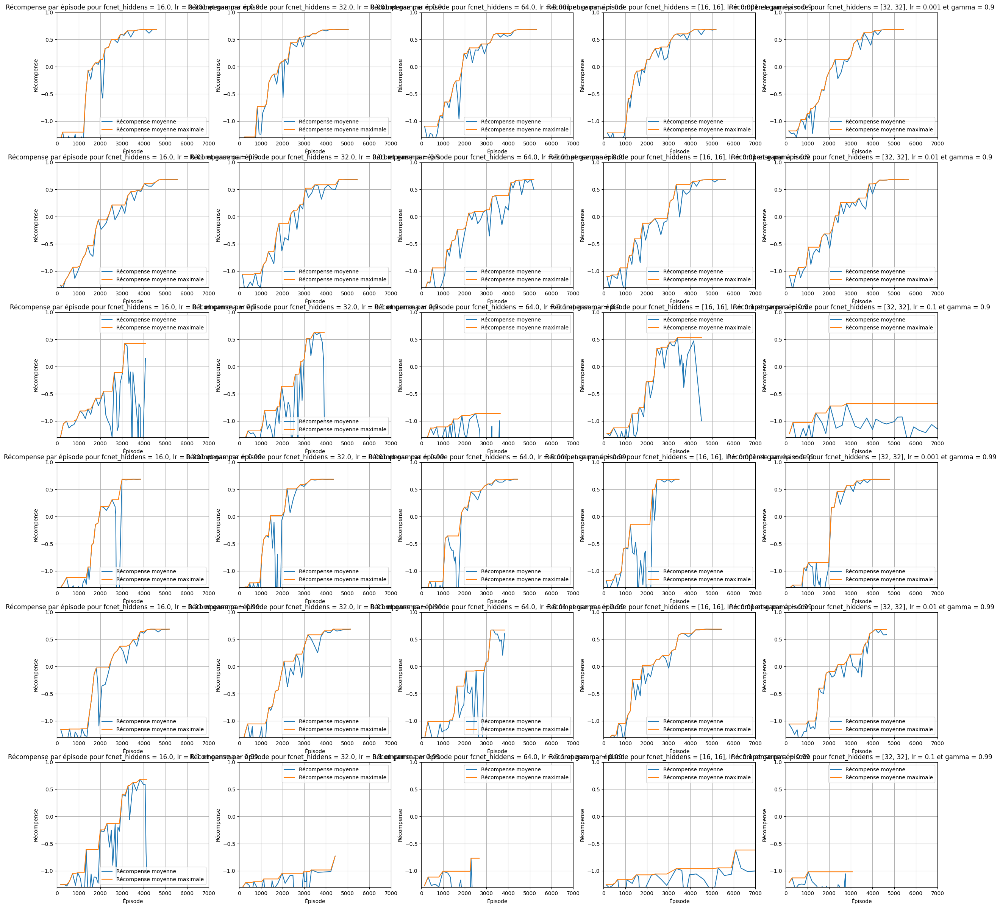

In [20]:
comparison_plot_3(results,
                  "fcnet_hiddens", [16., 32., 64., [16, 16], [32, 32]],
                  "lr", [0.001, 0.01, 0.1],
                  "gamma", [0.9, 0.99],
                  0, 7000,
                  -1.3, 1
                 )

Meilleurs résultats pour

- Architecture : [32, 32]
- lr = 0.001
- gamma = 0.9

### Observations taille 6

In [31]:
config = (
    DQNConfig()
    .environment(
        LivraisonRLlibEnv,
        env_config = {'carte' : generate_random_map(6)},
    )
    
    .env_runners(
        env_to_module_connector=lambda env: FlattenObservations(),
        num_env_runners=3,
        num_envs_per_env_runner = 10
    )


    .training(
        lr = tune.grid_search([0.0001, 0.001, 0.01]),
        gamma = 0.9,
        epsilon = [[0, 1], [35000, 0.01]],
        train_batch_size_per_learner=tune.grid_search([32, 64, 128, 256]),
        target_network_update_freq = tune.grid_search([100, 250, 500, 1000])
    )

    .rl_module(
        model_config = {
            "fcnet_hiddens" : [32, 32]
        }
    )
)



tuner = tune.Tuner(
    config.algo_class,
    param_space=config,
    run_config=train.RunConfig(
        stop={"num_env_steps_sampled_lifetime": 40000},
    ),
)
results = tuner.fit()

ray.shutdown()

(DQN pid=42807) 2025-06-19 09:26:09,226	WARNING algorithm_config.py:4968 -- You are running DQN on the new API stack! This is the new default behavior for this algorithm. If you don't want to use the new API stack, set `config.api_stack(enable_rl_module_and_learner=False,enable_env_runner_and_connector_v2=False)`. For a detailed migration guide, see here: https://docs.ray.io/en/master/rllib/new-api-stack-migration-guide.html
(SingleAgentEnvRunner pid=42910) 2025-06-19 09:26:13,310	WARNING deprecation.py:50 -- DeprecationWarning: `RLModule(config=[RLModuleConfig object])` has been deprecated. Use `RLModule(observation_space=.., action_space=.., inference_only=.., model_config=.., catalog_class=..)` instead. This will raise an error in the future!
(DQN pid=42806) 2025-06-19 09:26:09,295	WARNING algorithm_config.py:4968 -- You are running DQN on the new API stack! This is the new default behavior for this algorithm. If you don't want to use the new API stack, set `config.api_stack(enable_

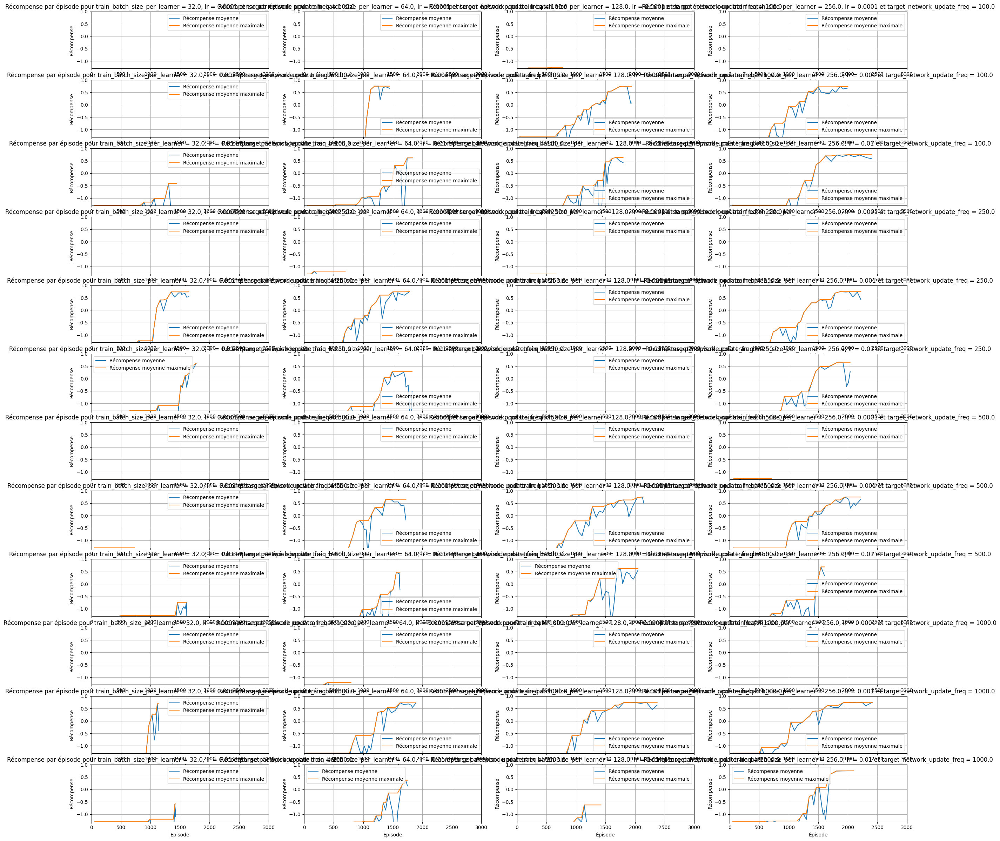

In [33]:
comparison_plot_3(results,
                  "train_batch_size_per_learner", [32., 64., 128., 256.],
                  "lr", [0.0001, 0.001, 0.01],
                  "target_network_update_freq", [100, 250, 500, 1000],
                  0, 3000,
                  -1.3, 1
                 )

Meilleurs résultats :

- batch_size_per_learner : 256
- Architecture : [32, 32]
- lr = 0.001
- gamma = 0.9
- target_network_update_freq : 1000

### Observations taille 8

In [5]:
config = (
    DQNConfig()
    .environment(
        LivraisonRLlibEnv,
        env_config = {'carte' : generate_random_map(8)},
    )
    
    .env_runners(
        env_to_module_connector=lambda env: FlattenObservations(),
        num_env_runners=3,
        num_envs_per_env_runner = 10
    )


    .training(
        lr = tune.grid_search([0.0001, 0.001, 0.01]),
        gamma = 0.9,
        epsilon = [[0, 1], [35000, 0.01]],
        train_batch_size_per_learner=tune.grid_search([32, 64, 128, 256]),
        target_network_update_freq = tune.grid_search([100, 250, 500, 1000])
    )

    .rl_module(
        model_config = {
            "fcnet_hiddens" : [32, 32]
        }
    )
)



tuner = tune.Tuner(
    config.algo_class,
    param_space=config,
    run_config=train.RunConfig(
        stop={"num_env_steps_sampled_lifetime": 40000},
    ),
)
results = tuner.fit()

ray.shutdown()

2025-06-19 10:18:07,891	WARNING algorithm_config.py:4968 -- You are running DQN on the new API stack! This is the new default behavior for this algorithm. If you don't want to use the new API stack, set `config.api_stack(enable_rl_module_and_learner=False,enable_env_runner_and_connector_v2=False)`. For a detailed migration guide, see here: https://docs.ray.io/en/master/rllib/new-api-stack-migration-guide.html
(DQN pid=63898) 2025-06-19 10:18:11,197	WARNING algorithm_config.py:4968 -- You are running DQN on the new API stack! This is the new default behavior for this algorithm. If you don't want to use the new API stack, set `config.api_stack(enable_rl_module_and_learner=False,enable_env_runner_and_connector_v2=False)`. For a detailed migration guide, see here: https://docs.ray.io/en/master/rllib/new-api-stack-migration-guide.html
(SingleAgentEnvRunner pid=64014) 2025-06-19 10:18:15,572	WARNING deprecation.py:50 -- DeprecationWarning: `RLModule(config=[RLModuleConfig object])` has been 

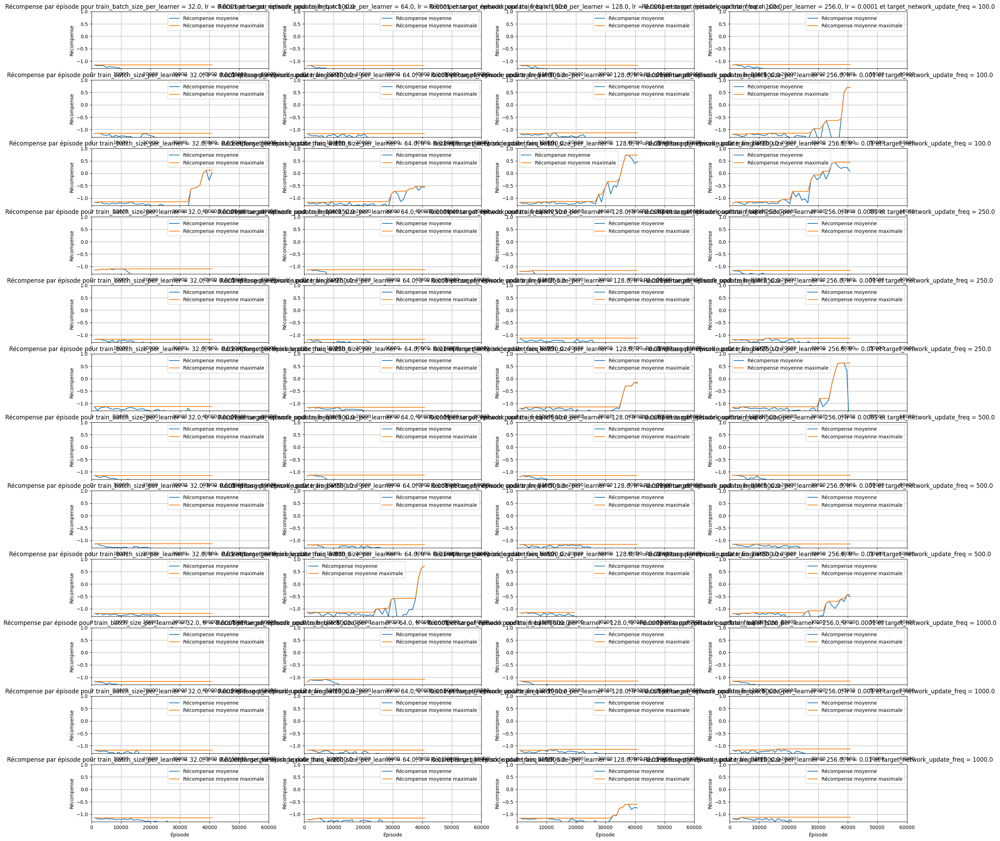

In [11]:
comparison_plot_3(results,
                  "train_batch_size_per_learner", [32., 64., 128., 256.],
                  "lr", [0.0001, 0.001, 0.01],
                  "target_network_update_freq", [100, 250, 500, 1000],
                  0, 60000,
                  -1.3, 1
                 )

Meilleurs résultats pour :

- train_batch_size_per_learner : 256
- lr : 0.001
- target_network_update_freq : 100
- architecture : [32, 32]
- gamma : 0.9

In [12]:
config = (
    DQNConfig()
    .environment(
        LivraisonRLlibEnv,
        env_config = {'carte' : generate_random_map(8)},
    )
    
    .env_runners(
        env_to_module_connector=lambda env: FlattenObservations(),
        num_env_runners=3,
        num_envs_per_env_runner = 10
    )


    .training(
        lr = 0.001,
        gamma = 0.9,
        epsilon = [[0, 1], [80000, 0.01]],
        train_batch_size_per_learner=tune.grid_search([128, 256, 512, 1024]),
        target_network_update_freq = tune.grid_search([10, 50, 100, 500])
    )

    .rl_module(
        model_config = {
            "fcnet_hiddens" : [32, 32]
        }
    )
)



tuner = tune.Tuner(
    config.algo_class,
    param_space=config,
    run_config=train.RunConfig(
        stop={"num_env_steps_sampled_lifetime": 100000},
    ),
)
results = tuner.fit()

ray.shutdown()

(DQN pid=85946) 2025-06-19 12:12:14,851	WARNING algorithm_config.py:4968 -- You are running DQN on the new API stack! This is the new default behavior for this algorithm. If you don't want to use the new API stack, set `config.api_stack(enable_rl_module_and_learner=False,enable_env_runner_and_connector_v2=False)`. For a detailed migration guide, see here: https://docs.ray.io/en/master/rllib/new-api-stack-migration-guide.html
(SingleAgentEnvRunner pid=86055) 2025-06-19 12:12:19,362	WARNING deprecation.py:50 -- DeprecationWarning: `RLModule(config=[RLModuleConfig object])` has been deprecated. Use `RLModule(observation_space=.., action_space=.., inference_only=.., model_config=.., catalog_class=..)` instead. This will raise an error in the future!
(DQN pid=85947) 2025-06-19 12:12:14,882	WARNING algorithm_config.py:4968 -- You are running DQN on the new API stack! This is the new default behavior for this algorithm. If you don't want to use the new API stack, set `config.api_stack(enable_

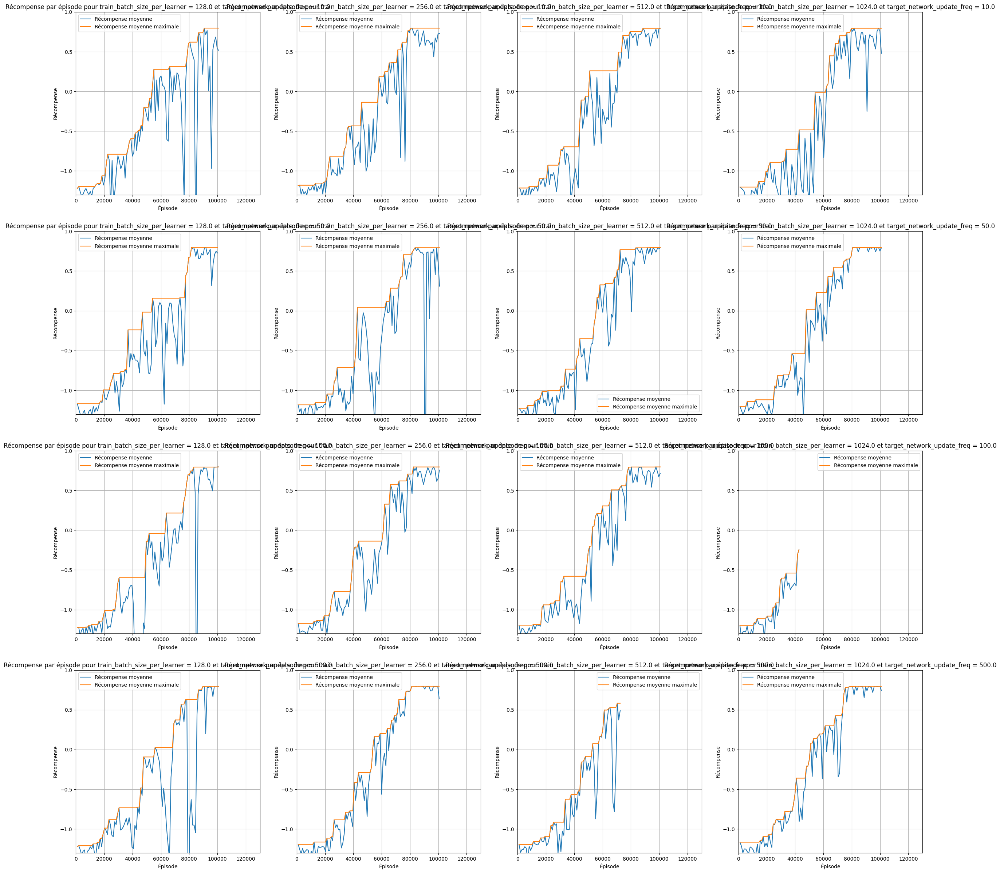

In [15]:
comparison_plot_2(results,
                  "train_batch_size_per_learner", [128., 256., 512., 1024.],
                  "target_network_update_freq", [10, 50, 100, 500],
                  0, 130000,
                  -1.3, 1
                 )

Meilleure récompense :

- architecture : [32, 32]
- lr : 0.001
- gamma : 0.9
- train_batch_size_per_learner : 1024
- target_network_update_freq : 500

### Observations taille 10

In [4]:
config = (
    DQNConfig()
    .environment(
        LivraisonRLlibEnv,
        env_config = {'carte' : generate_random_map(10)},
    )
    
    .env_runners(
        env_to_module_connector=lambda env: FlattenObservations(),
        num_env_runners=3,
        num_envs_per_env_runner = 10
    )


    .training(
        lr = 0.001,
        gamma = 0.9,
        epsilon = [[0, 1], [80000, 0.01]],
        train_batch_size_per_learner=tune.grid_search([512, 1024, 2048, 4096]),
        target_network_update_freq = tune.grid_search([100, 500, 750, 1000])
    )

    .rl_module(
        model_config = {
            "fcnet_hiddens" : [32, 32]
        }
    )
)



tuner = tune.Tuner(
    config.algo_class,
    param_space=config,
    run_config=train.RunConfig(
        stop={"num_env_steps_sampled_lifetime": 100000},
    ),
)
results = tuner.fit()

ray.shutdown()

2025-06-19 18:56:33,182	WARNING algorithm_config.py:4766 -- You are running DQN on the new API stack! This is the new default behavior for this algorithm. If you don't want to use the new API stack, set `config.api_stack(enable_rl_module_and_learner=False,enable_env_runner_and_connector_v2=False)`. For a detailed migration guide, see here: https://docs.ray.io/en/master/rllib/new-api-stack-migration-guide.html
(DQN pid=4570) 2025-06-19 18:56:36,760	WARNING algorithm_config.py:4766 -- You are running DQN on the new API stack! This is the new default behavior for this algorithm. If you don't want to use the new API stack, set `config.api_stack(enable_rl_module_and_learner=False,enable_env_runner_and_connector_v2=False)`. For a detailed migration guide, see here: https://docs.ray.io/en/master/rllib/new-api-stack-migration-guide.html
(SingleAgentEnvRunner pid=4641) 2025-06-19 18:56:41,456	WARNING deprecation.py:50 -- DeprecationWarning: `RLModule(config=[RLModuleConfig object])` has been de

(SingleAgentEnvRunner pid=6489) 2025-06-19 19:16:09,431	WARNING deprecation.py:50 -- DeprecationWarning: `RLModule(config=[RLModuleConfig object])` has been deprecated. Use `RLModule(observation_space=.., action_space=.., inference_only=.., model_config=.., catalog_class=..)` instead. This will raise an error in the future!
(DQN pid=6450) Install gputil for GPU system monitoring.
(DQN(env=<class '__main__.LivraisonRLlibEnv'>; env-runners=3; learners=0; multi-agent=False) pid=6450) Checkpoint successfully created at: Checkpoint(filesystem=local, path=/home/thewalder/ray_results/DQN_2025-06-19_18-56-29/DQN_LivraisonRLlibEnv_5a884_00002_2_train_batch_size_per_learner=2048,target_network_update_freq=100_2025-06-19_18-56-33/checkpoint_000000)
(DQN pid=6450) 2025-06-19 19:16:09,629	WARNING deprecation.py:50 -- DeprecationWarning: `RLModule(config=[RLModuleConfig object])` has been deprecated. Use `RLModule(observation_space=.., action_space=.., inference_only=.., model_config=.., catalog_cla

(DQN pid=8373) 2025-06-19 20:03:36,528	WARNING algorithm_config.py:4766 -- You are running DQN on the new API stack! This is the new default behavior for this algorithm. If you don't want to use the new API stack, set `config.api_stack(enable_rl_module_and_learner=False,enable_env_runner_and_connector_v2=False)`. For a detailed migration guide, see here: https://docs.ray.io/en/master/rllib/new-api-stack-migration-guide.html
(SingleAgentEnvRunner pid=8411) 2025-06-19 20:03:41,021	WARNING deprecation.py:50 -- DeprecationWarning: `RLModule(config=[RLModuleConfig object])` has been deprecated. Use `RLModule(observation_space=.., action_space=.., inference_only=.., model_config=.., catalog_class=..)` instead. This will raise an error in the future!
(SingleAgentEnvRunner pid=8410) 2025-06-19 20:03:41,073	WARNING deprecation.py:50 -- DeprecationWarning: `RLModule(config=[RLModuleConfig object])` has been deprecated. Use `RLModule(observation_space=.., action_space=.., inference_only=.., model

(DQN pid=15248) Install gputil for GPU system monitoring.
(DQN pid=15248) 2025-06-19 21:40:36,433	WARNING deprecation.py:50 -- DeprecationWarning: `RLModule(config=[RLModuleConfig object])` has been deprecated. Use `RLModule(observation_space=.., action_space=.., inference_only=.., model_config=.., catalog_class=..)` instead. This will raise an error in the future! [repeated 4x across cluster]
(DQN(env=<class '__main__.LivraisonRLlibEnv'>; env-runners=3; learners=0; multi-agent=False) pid=15248) Checkpoint successfully created at: Checkpoint(filesystem=local, path=/home/thewalder/ray_results/DQN_2025-06-19_18-56-29/DQN_LivraisonRLlibEnv_5a884_00008_8_train_batch_size_per_learner=512,target_network_update_freq=750_2025-06-19_18-56-33/checkpoint_000000)
(DQN pid=15667) 2025-06-19 21:49:41,181	WARNING algorithm_config.py:4766 -- You are running DQN on the new API stack! This is the new default behavior for this algorithm. If you don't want to use the new API stack, set `config.api_stack(e

(DQN pid=21295) Install gputil for GPU system monitoring.
(DQN(env=<class '__main__.LivraisonRLlibEnv'>; env-runners=3; learners=0; multi-agent=False) pid=21295) Checkpoint successfully created at: Checkpoint(filesystem=local, path=/home/thewalder/ray_results/DQN_2025-06-19_18-56-29/DQN_LivraisonRLlibEnv_5a884_00013_13_train_batch_size_per_learner=1024,target_network_update_freq=1000_2025-06-19_18-56-33/checkpoint_000000)
(DQN pid=21295) 2025-06-19 23:36:26,647	WARNING deprecation.py:50 -- DeprecationWarning: `RLModule(config=[RLModuleConfig object])` has been deprecated. Use `RLModule(observation_space=.., action_space=.., inference_only=.., model_config=.., catalog_class=..)` instead. This will raise an error in the future! [repeated 3x across cluster]
(DQN pid=22389) 2025-06-19 23:51:01,610	WARNING algorithm_config.py:4766 -- You are running DQN on the new API stack! This is the new default behavior for this algorithm. If you don't want to use the new API stack, set `config.api_stac

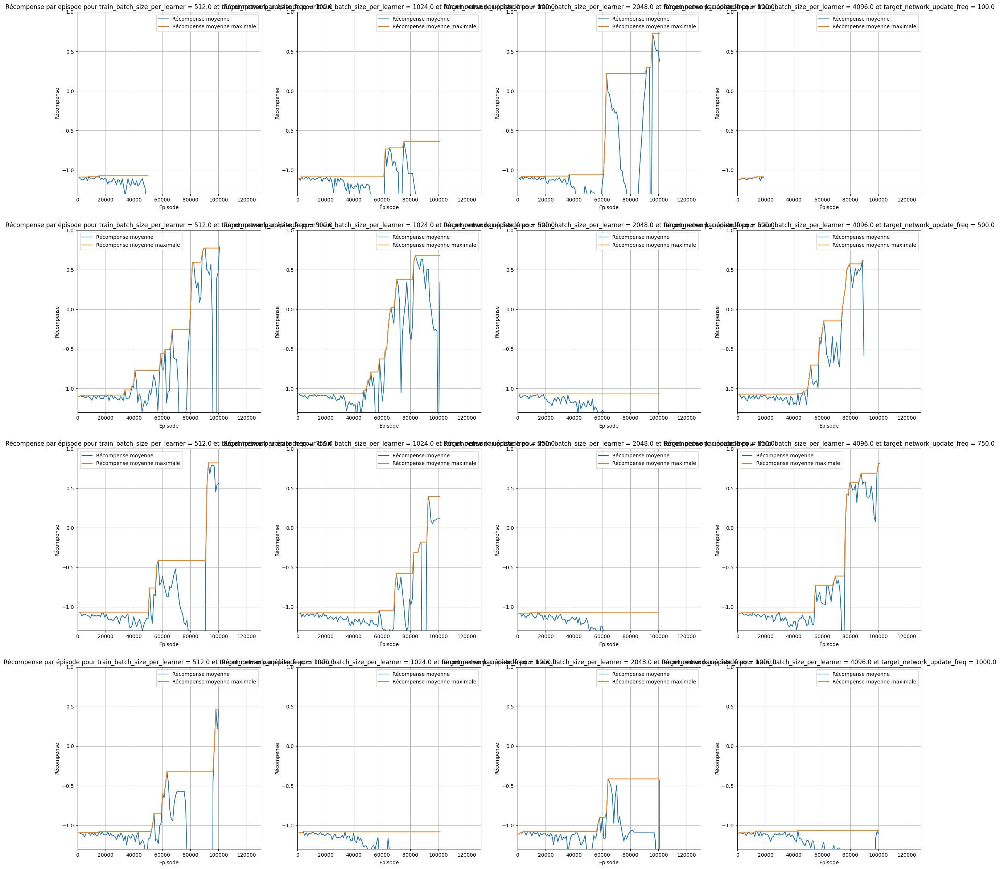

In [5]:
comparison_plot_2(results,
                  "train_batch_size_per_learner", [512., 1024., 2048., 4096.],
                  "target_network_update_freq", [100, 500, 750, 1000],
                  0, 130000,
                  -1.3, 1
                 )

Meilleure récompense :

- architecture : [32, 32]
- lr : 0.001
- gamma : 0.9
- train_batch_size_per_learner : 512
- target_network_update_freq : 750

In [6]:
config = (
    DQNConfig()
    .environment(
        LivraisonRLlibEnv,
        env_config = {'carte' : generate_random_map(10)},
    )
    
    .env_runners(
        env_to_module_connector=lambda env: FlattenObservations(),
        num_env_runners=3,
        num_envs_per_env_runner = 10
    )


    .training(
        lr = tune.grid_search([0.00001, 0.0001, 0.001, 0.01]),
        gamma = 0.9,
        epsilon = [[0, 1], [80000, 0.01]],
        train_batch_size_per_learner=512,
        target_network_update_freq = 750
    )

    .rl_module(
        model_config = {
            "fcnet_hiddens" : tune.grid_search([[16], [32], [64], [128], [32, 32], [128, 128]])
        }
    )
)



tuner = tune.Tuner(
    config.algo_class,
    param_space=config,
    run_config=train.RunConfig(
        stop={"num_env_steps_sampled_lifetime": 100000},
    ),
)
results = tuner.fit()

ray.shutdown()

2025-06-20 08:20:31,226	WARNING algorithm_config.py:4968 -- You are running DQN on the new API stack! This is the new default behavior for this algorithm. If you don't want to use the new API stack, set `config.api_stack(enable_rl_module_and_learner=False,enable_env_runner_and_connector_v2=False)`. For a detailed migration guide, see here: https://docs.ray.io/en/master/rllib/new-api-stack-migration-guide.html
(DQN pid=6066) 2025-06-20 08:20:34,418	WARNING algorithm_config.py:4968 -- You are running DQN on the new API stack! This is the new default behavior for this algorithm. If you don't want to use the new API stack, set `config.api_stack(enable_rl_module_and_learner=False,enable_env_runner_and_connector_v2=False)`. For a detailed migration guide, see here: https://docs.ray.io/en/master/rllib/new-api-stack-migration-guide.html
(SingleAgentEnvRunner pid=6181) 2025-06-20 08:20:38,563	WARNING deprecation.py:50 -- DeprecationWarning: `RLModule(config=[RLModuleConfig object])` has been de

In [9]:
print(results[0].path)

/home/enzo/ray_results/DQN_2025-06-20_08-20-29/DQN_LivraisonRLlibEnv_aaa5f_00000_0_fcnet_hiddens=16,lr=0.0000_2025-06-20_08-20-31


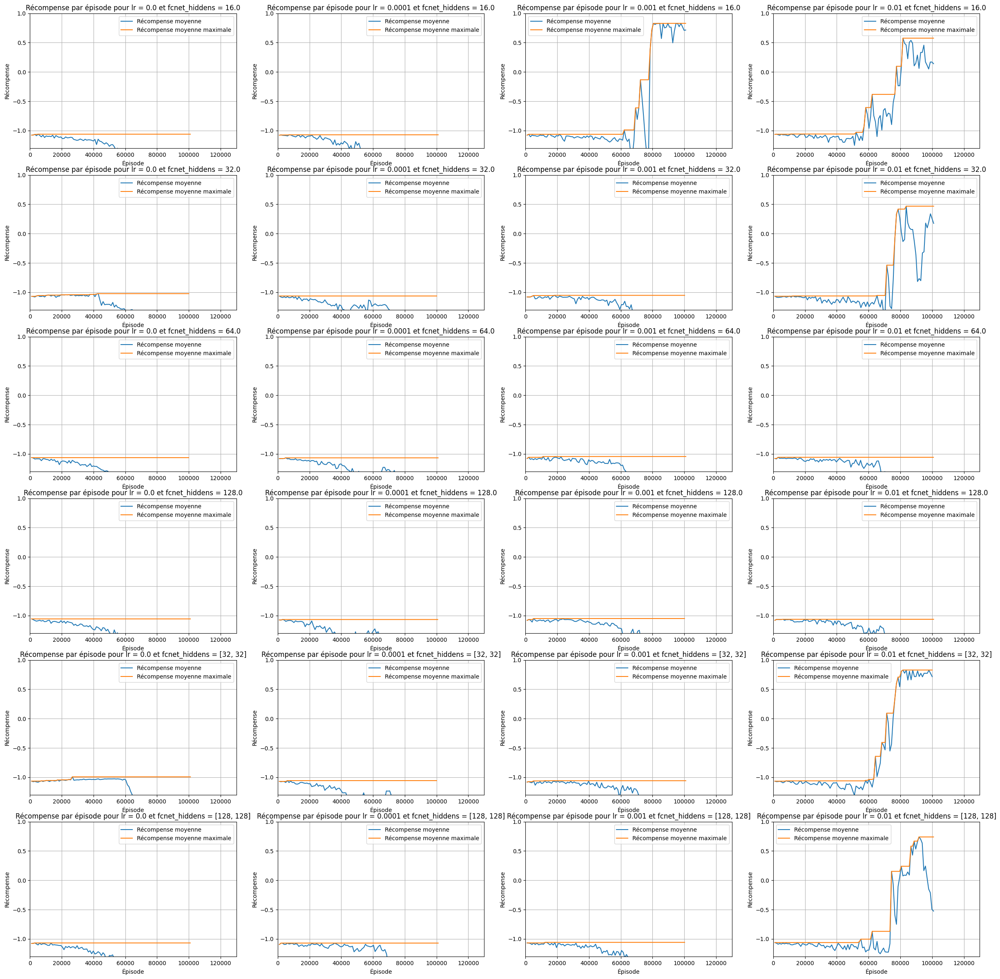

In [10]:
comparison_plot_2(results,
                  "lr", [0.0000, 0.0001, 0.001, 0.01],
                  "fcnet_hiddens", [16, 32, 64, 128, [32, 32], [128, 128]],
                  0, 130000,
                  -1.3, 1
                 )

Meilleure récompense :

- architecture : [32, 32]
- lr : 0.01
- gamma : 0.9
- train_batch_size_per_learner : 512
- target_network_update_freq : 750

In [9]:
config = (
    DQNConfig()
    .environment(
        LivraisonRLlibEnv,
        env_config = {'carte' : generate_random_map(10)},
    )
    
    .env_runners(
        env_to_module_connector=lambda env: FlattenObservations(),
        num_env_runners=3,
        num_envs_per_env_runner = 10
    )


    .training(
        lr = tune.grid_search([0.001, 0.01, 0.1, 0.9]),
        gamma = 0.9,
        epsilon = [[0, 1], [80000, 0.01]],
        train_batch_size_per_learner= tune.grid_search([128, 256, 512, 1024]),
        target_network_update_freq = 750,
        replay_buffer_config = {
            "capacity" : tune.grid_search([30000, 50000, 80000])
        }
    )

    .rl_module(
        model_config = {
            "fcnet_hiddens" : [32, 32]
        }
    )
)



tuner = tune.Tuner(
    config.algo_class,
    param_space=config,
    run_config=train.RunConfig(
        stop={"num_env_steps_sampled_lifetime": 100000},
    ),
)
results = tuner.fit()

ray.shutdown()

2025-06-24 14:10:48,820	WARNING algorithm_config.py:4968 -- You are running DQN on the new API stack! This is the new default behavior for this algorithm. If you don't want to use the new API stack, set `config.api_stack(enable_rl_module_and_learner=False,enable_env_runner_and_connector_v2=False)`. For a detailed migration guide, see here: https://docs.ray.io/en/master/rllib/new-api-stack-migration-guide.html
(DQN pid=15473) 2025-06-24 14:10:52,240	WARNING algorithm_config.py:4968 -- You are running DQN on the new API stack! This is the new default behavior for this algorithm. If you don't want to use the new API stack, set `config.api_stack(enable_rl_module_and_learner=False,enable_env_runner_and_connector_v2=False)`. For a detailed migration guide, see here: https://docs.ray.io/en/master/rllib/new-api-stack-migration-guide.html
(SingleAgentEnvRunner pid=15590) 2025-06-24 14:10:56,218	WARNING deprecation.py:50 -- DeprecationWarning: `RLModule(config=[RLModuleConfig object])` has been 

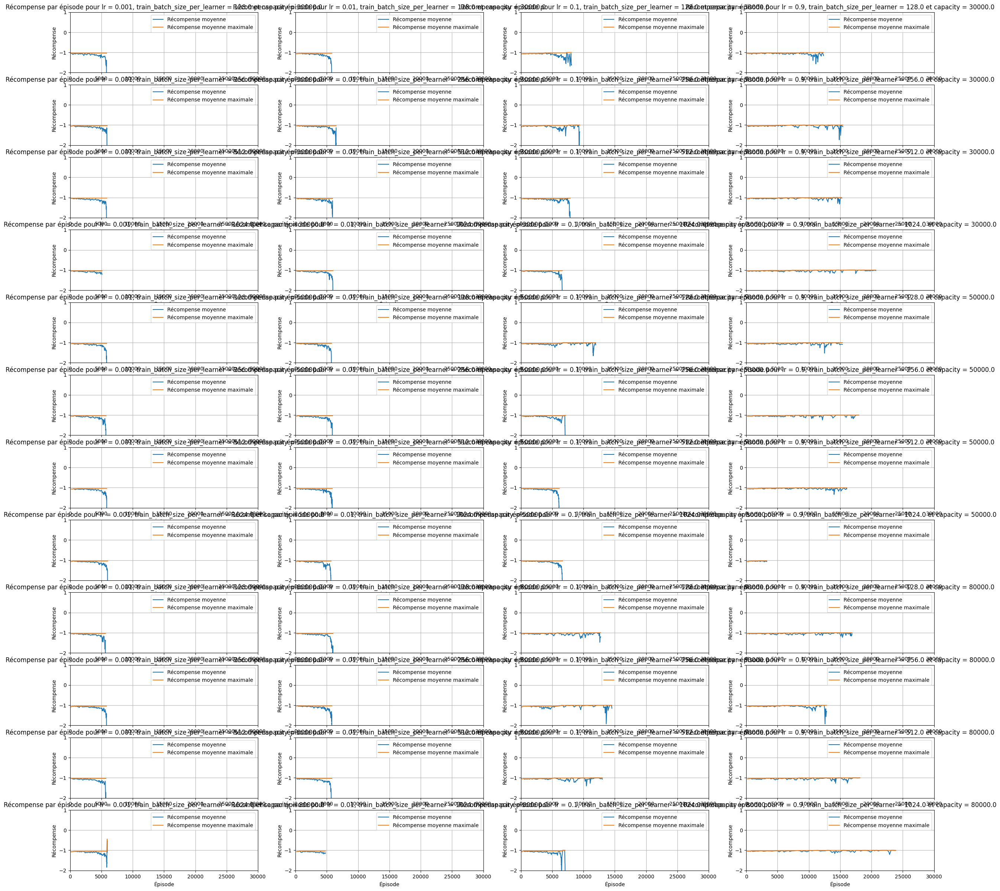

In [13]:
comparison_plot_3(results,
                  "lr", [0.001, 0.01, 0.1, 0.9],
                  "train_batch_size_per_learner", [128, 256, 512, 1024],
                  "capacity", [30000, 50000, 80000],
                  0, 30000,
                  -2, 1
                 )

# Comparaison Finale

.HHF
FHFF
FFFH
FFBG



/home/enzo/Documents/Depots/customEnv/lib/python3.12/site-packages/ray/rllib/algorithms/algorithm.py:521: RayDeprecationWarning: This API is deprecated and may be removed in future Ray releases. You could suppress this warning by setting env variable PYTHONWARNINGS="ignore::DeprecationWarning"
`UnifiedLogger` will be removed in Ray 2.7.
  return UnifiedLogger(config, logdir, loggers=None)
/home/enzo/Documents/Depots/customEnv/lib/python3.12/site-packages/ray/tune/logger/unified.py:53: RayDeprecationWarning: This API is deprecated and may be removed in future Ray releases. You could suppress this warning by setting env variable PYTHONWARNINGS="ignore::DeprecationWarning"
The `JsonLogger interface is deprecated in favor of the `ray.tune.json.JsonLoggerCallback` interface and will be removed in Ray 2.7.
  self._loggers.append(cls(self.config, self.logdir, self.trial))
/home/enzo/Documents/Depots/customEnv/lib/python3.12/site-packages/ray/tune/logger/unified.py:53: RayDeprecationWarning: T

.FFHHF
FFFFFF
FFFFFF
FHFFFB
FFFFFF
FFFFFG



/home/enzo/Documents/Depots/customEnv/lib/python3.12/site-packages/ray/rllib/algorithms/algorithm.py:521: RayDeprecationWarning: This API is deprecated and may be removed in future Ray releases. You could suppress this warning by setting env variable PYTHONWARNINGS="ignore::DeprecationWarning"
`UnifiedLogger` will be removed in Ray 2.7.
  return UnifiedLogger(config, logdir, loggers=None)
/home/enzo/Documents/Depots/customEnv/lib/python3.12/site-packages/ray/tune/logger/unified.py:53: RayDeprecationWarning: This API is deprecated and may be removed in future Ray releases. You could suppress this warning by setting env variable PYTHONWARNINGS="ignore::DeprecationWarning"
The `JsonLogger interface is deprecated in favor of the `ray.tune.json.JsonLoggerCallback` interface and will be removed in Ray 2.7.
  self._loggers.append(cls(self.config, self.logdir, self.trial))
/home/enzo/Documents/Depots/customEnv/lib/python3.12/site-packages/ray/tune/logger/unified.py:53: RayDeprecationWarning: T

.FFFHFFF
HFFFFFFF
FFFHFBFF
FHFFFFHH
FFHFFFHF
FFFFFFFF
FFFHFFFF
FHHHFFHG



/home/enzo/Documents/Depots/customEnv/lib/python3.12/site-packages/ray/rllib/algorithms/algorithm.py:521: RayDeprecationWarning: This API is deprecated and may be removed in future Ray releases. You could suppress this warning by setting env variable PYTHONWARNINGS="ignore::DeprecationWarning"
`UnifiedLogger` will be removed in Ray 2.7.
  return UnifiedLogger(config, logdir, loggers=None)
/home/enzo/Documents/Depots/customEnv/lib/python3.12/site-packages/ray/tune/logger/unified.py:53: RayDeprecationWarning: This API is deprecated and may be removed in future Ray releases. You could suppress this warning by setting env variable PYTHONWARNINGS="ignore::DeprecationWarning"
The `JsonLogger interface is deprecated in favor of the `ray.tune.json.JsonLoggerCallback` interface and will be removed in Ray 2.7.
  self._loggers.append(cls(self.config, self.logdir, self.trial))
/home/enzo/Documents/Depots/customEnv/lib/python3.12/site-packages/ray/tune/logger/unified.py:53: RayDeprecationWarning: T

.FFFFFFFFF
BFHFFHHFFH
FFFHFFHFFF
HFFFFFFFHF
FFFFFHFFFF
FFFFFFHFFH
FFFFFFFHFF
FFHFFFHHFH
FFFFHFFFFF
FFFFFHFFHG



/home/enzo/Documents/Depots/customEnv/lib/python3.12/site-packages/ray/rllib/algorithms/algorithm.py:521: RayDeprecationWarning: This API is deprecated and may be removed in future Ray releases. You could suppress this warning by setting env variable PYTHONWARNINGS="ignore::DeprecationWarning"
`UnifiedLogger` will be removed in Ray 2.7.
  return UnifiedLogger(config, logdir, loggers=None)
/home/enzo/Documents/Depots/customEnv/lib/python3.12/site-packages/ray/tune/logger/unified.py:53: RayDeprecationWarning: This API is deprecated and may be removed in future Ray releases. You could suppress this warning by setting env variable PYTHONWARNINGS="ignore::DeprecationWarning"
The `JsonLogger interface is deprecated in favor of the `ray.tune.json.JsonLoggerCallback` interface and will be removed in Ray 2.7.
  self._loggers.append(cls(self.config, self.logdir, self.trial))
/home/enzo/Documents/Depots/customEnv/lib/python3.12/site-packages/ray/tune/logger/unified.py:53: RayDeprecationWarning: T

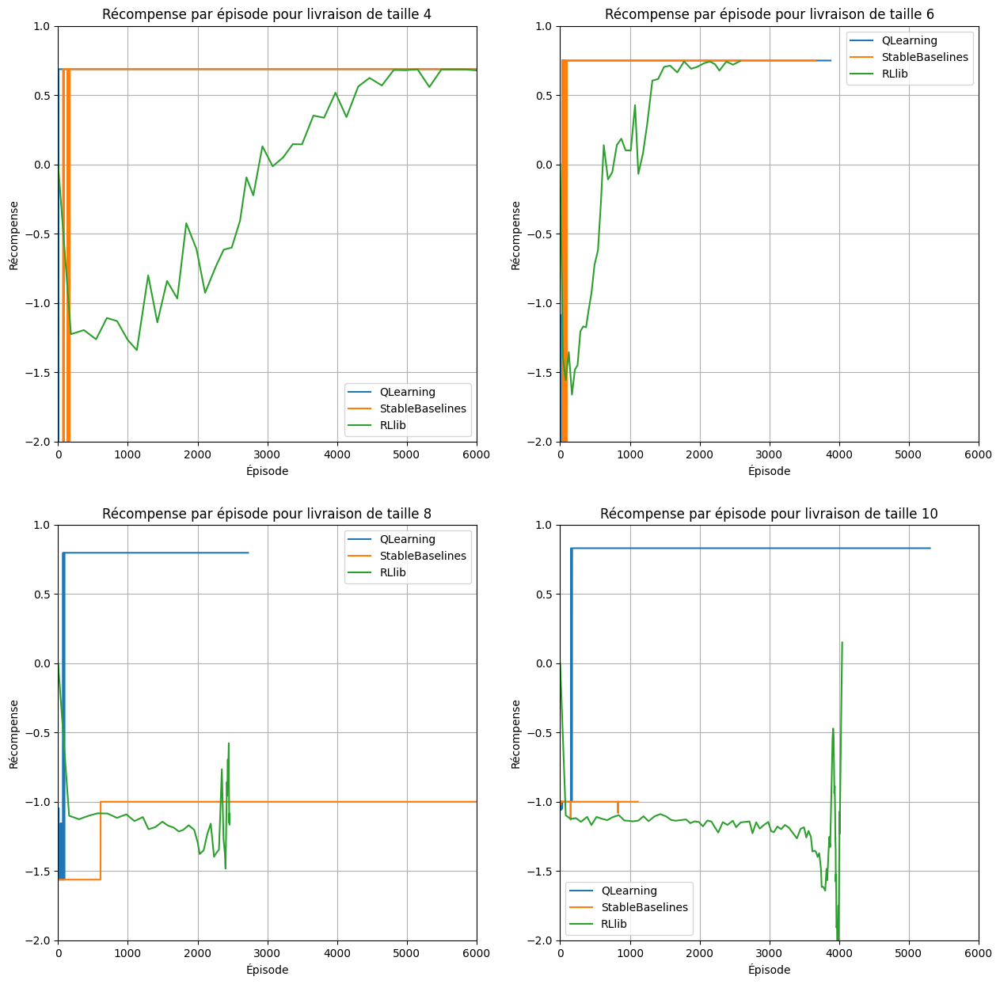

In [17]:
fig, axes = plt.subplots(2, 2, figsize=(15, 15))
data = [(4, 0, 0, 40000, ([16])), (6, 0, 1, 40000, ([16])), 
        (8, 1, 0, 40000, ([64, 64])), (10, 1, 1, 100000, ([64, 64]))]

for size, x, y, timesteps, (net_arch) in data :
    carte = generate_random_map(size)
    env = LivraisonRLlibEnv({'carte' : carte})
    env.render()

    
    envQLearning = LivraisonEnv(carte)
    
    QTableOpti, Qrew, QrewOpti = train_q_learning(envQLearning, timesteps = timesteps, eps_start = 0.01, eps_end = 0.01, alpha = 1, gamma = 0.99,
                                               useProdForReward = True)

    axes[x ,y].plot(QrewOpti, label = 'QLearning')
    
    
    stable_model, stable_rewards, stableProdRewards = train_dqn(env, exploration_initial_eps = 1, batch_size = 1000, buffer_size=100000,
              exploration_fraction = 0.2, exploration_final_eps = 0.01, learning_rate = 0.001, update_freq = 50, gamma = 0.99, net_arch = net_arch,
              timesteps = timesteps, useProdForReward = True)
    
    
    axes[x ,y].plot(stableProdRewards, label = 'StableBaselines')


    config = (
        DQNConfig()
        .environment(
            LivraisonRLlibEnv,
            env_config = {'carte' : carte}
        )
        
        .env_runners(
        env_to_module_connector=lambda env: FlattenObservations(),
        num_env_runners=3,
        num_envs_per_env_runner = 10
        )
    
        .training(
            lr = 0.01,
            gamma = 0.9,
            target_network_update_freq = 750,
            train_batch_size_per_learner = 512,
            epsilon = [[0, 1], [timesteps * 0.8, 0.01]],
        )
        
        .rl_module(
            model_config = {
                "fcnet_hiddens" : [32, 32]
            }
        )

    )

    
    algo = config.build_algo()
    ordonnees = [0]
    toPlot = [0]
    timesteps_done = 0
    while timesteps_done < timesteps :
        resu = algo.train()
        timesteps_done = resu['env_runners']['num_env_steps_sampled_lifetime']
        ordonnees.append(ordonnees[-1] + resu['env_runners']['num_episodes'])
        toPlot.append(resu['env_runners']['episode_return_mean'])
    axes[x, y].plot(ordonnees, toPlot, label = 'RLlib')
    algo.stop()

    ray.shutdown()

    
    axes[x, y].legend()
    axes[x ,y].set_xlabel("Épisode")
    axes[x ,y].set_ylabel("Récompense")
    axes[x ,y].set_title(f"Récompense par épisode pour livraison de taille {size}")
    axes[x ,y].grid()
    axes[x ,y].set_xlim([0, 6000])
    axes[x ,y].set_ylim([-2, 1])
plt.show()

Stable Baselines est donc plus efficace que RLlib pour ce problème et le QLearning l'est encore plus.